<a href="https://colab.research.google.com/github/globaltechiee/GT_image_clf/blob/master/GT_image_clf.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import sys
if 'google.colab' in sys.modules:
    
    # Clone GitHub repository
    !git clone https://github.com/globaltechiee/GT_image_clf.git

    # Copy files required to run the code
    !cp -r 'GT_image_clf/downloads' 'GT_image_clf/utils.py' .

    # Install packages via pip
    !pip install -r "GT_image_clf/colab-requirements.txt"

    # Restart Runtime
    import os
    os.kill(os.getpid(), 9)
        

fatal: destination path 'GT_image_clf' already exists and is not an empty directory.
     |████████████████████████████████| 7.8MB 6.6MB/s 
     |████████████████████████████████| 911kB 42.8MB/s 
     |████████████████████████████████| 61kB 8.1MB/s 
  Created wheel for google-images-download: filename=google_images_download-2.8.0-py2.py3-none-any.whl size=14550 sha256=e5da5844da88ffd27b9079d4d864351c9cfac3c5d270527dcb2e518daadab367
  Stored in directory: /root/.cache/pip/wheels/1f/28/ad/f56e7061e1d2a9a1affe2f9c649c2570cb9198dd24ede0bbab
Successfully built google-images-download
  Found existing installation: jsonschema 2.6.0
    Uninstalling jsonschema-2.6.0:
      Successfully uninstalled jsonschema-2.6.0


Image Classification

1. **Data Preparation**: Collect the data, clean it and prepare it for further analysis.


2. **Data Exploration**: Explore the dataset and modify it to your need.


3. **Modeling and Analysis**: Model creation, optimization & evaluation. 


4. **Results Discussion & Exploration**: Investigate model performance and understand results.




## Preparing the programming environment


In [1]:
import sys
if 'google.colab' in sys.modules:
    %tensorflow_version 2.x
%run utils.py
%matplotlib inline

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


# Data Preparation

1) Category of each label
2) the data is aggregated, 
3) cleaned 
4) stored in folder format per label.



## Define Class Labels

In [0]:
 # List of class labels to use for the image classification
class_labels = [
               'brown bear',
               'polar bear',
               'giant panda',
               'red panda',
               'lion',
               'tiger',
               'racoon',
               'red fox',
               ]

## Collect Data Set

Python package Google Images Download
It is limited to 100 downloads per search term so we add additonal search terms with search_suffix (close up, portrait etc)

In [0]:
# Define additional search terms to expand the number of searches
search_suffix = 'close up,portrait'

In [4]:
# Download the dataset and store the images on disk
imgs_raw = collect_images(class_labels, suffix=search_suffix)

---
A Total of N=3624 images were collected!


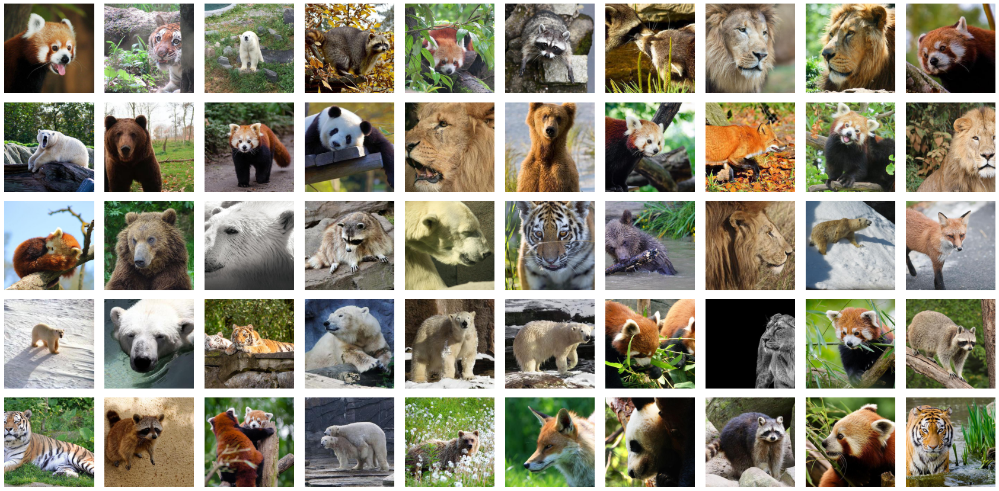

In [5]:
# Let's take a look at the data we've collected
plot_images(imgs_raw, n_col=10, n_row=5)

## Clean Dataset

- remove duplicates
- remove outliers or extreme values that are not part of the target population
- handle missing values

### Remove Duplicates

In [6]:
# Remove duplicates from the dataset
imgs_unique = remove_duplicates(imgs_raw)

Total number of images in the dataset: 3624
Number of duplicates in the dataset:    148


### Remove Outliers

Ideally you would do this by hand when it comes to images, to make sure that you only keep meaningful images in your dataset, i.e. images that belong to one of your target categories.

We will do it my color profile

Each image has a particular color profile, Looking at these particular RGB value distributions might allow us to differentiate photos of animals from heavily photoshopped images, gray colored images or graphical logos.
Group them by RGB

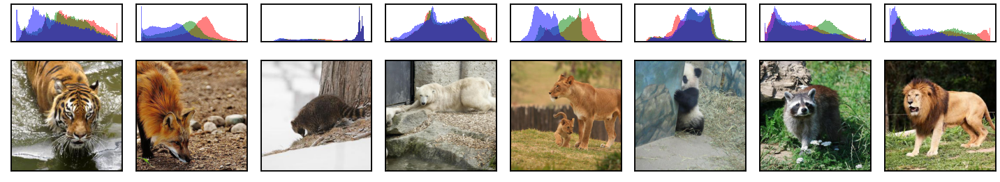

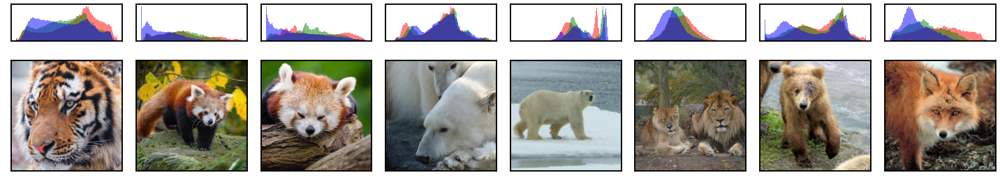

In [7]:
# Plot images together with their RGB color distributions
plot_images(imgs_unique, n_col=8, n_row=2, show_histogram=True)

To remove outlier images from the dataset, we will take a look at the RGB color profile of each image and remove images that are only in gray colors or that have sudden extreme spikes in the RGB profile

In [8]:
# Remove outliers from the dataset
imgs_clean, imgs_outlier = remove_outliers(imgs_unique)


Total number of images in the dataset: 3476
Number of outliers in the dataset:      239


Now dataset is seperated into clean and outlier images

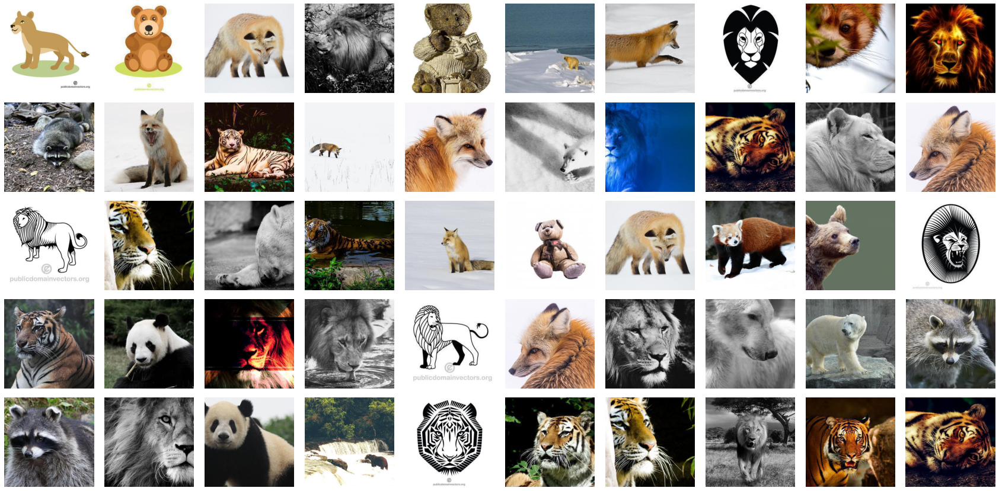

In [9]:
# Plot some outlier images
plot_images(imgs_outlier, n_col=10, n_row=5)

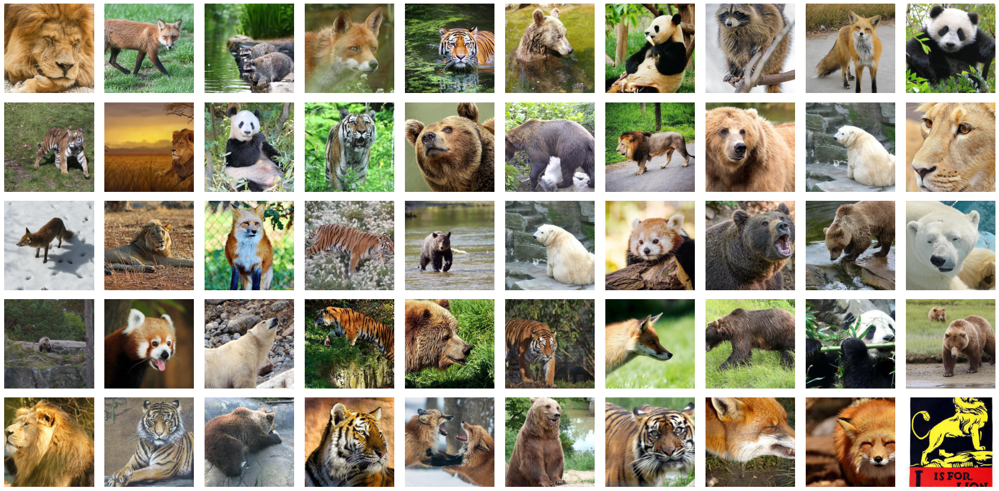

In [10]:
# Plot some clean images
plot_images(imgs_clean, n_col=10, n_row=5)

##Finalize the Dataset

**data preparation** section, we need to finalize the actual dataset and store the relevant image information in useful variables, conventionally called `X` and `y`.



The image dimension of 32 is used.
we can use 16, 64 or even 128 but the bigger the more computer resources are used. More does not always mean better.

In [11]:
# Create dataset
X_pixel, y_pixel, metainfo = create_dataset(imgs_clean, class_labels, img_dim=32)

Found 3237 images belonging to 8 classes.




Dataset was augmented to a total of N=6474 images through means of:
Image rotation, flipping, shifting, zooming and brightness variation.

Images resampled to a resolution of 32 x 32!



In machine learning, the variable **X** is usually used as the dataframe, i.e. the feature matrix that contains the detailed information about our samples. The variable **y** is used as the target variable, in this case the label for the class.

Here, we've added an additional variable called **metainfo** that contains relevant information about the dataset (e.g. size of dataset, class labels, image filenames, etc.)


The function **create_dataset** above also contains the parameter **img_dim=32**, which specified to which pixel resolution the images should be resampled. In this case, **32**means that all images are resized to a pixel resolution of 32 x 32. Downsampling images from their original size to a size of 32 x 32 reduces the computation time, and makes sure that all images have the same size.

</div>

#Data Exploration

**Explorative Data Analysis** (EDA). Each of our investigations during the EDA should lead to an observation, followed by a decision.

##Data Description

Let's look at the dataset and describe it's basic properties.

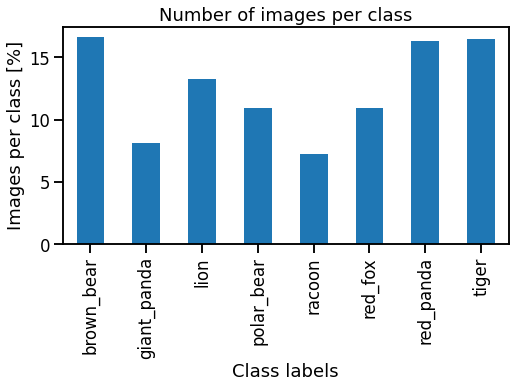

In [12]:
# How many images per class do we have?
plot_class_distribution(y_pixel, metainfo)

**Observation**: The classes are not equally distributed. Some classes have more than twice as many images than others.  
**Decision**: The unbalanced occurence of the different classes needs to be considered during the data modeling process.

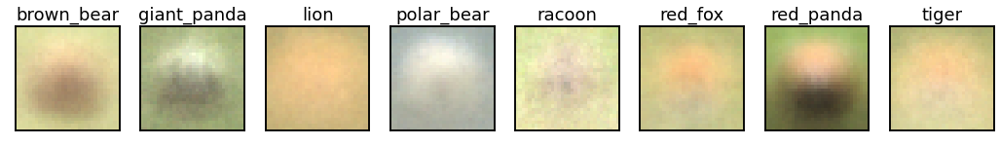

In [13]:
# What does the average image per target category look like?
plot_class_average(X_pixel, y_pixel, metainfo)

**Observation**: Some classes like `giant_panda`, `polar_bear` and `red_panda` have very unique color characteristics.  
**Decision**: Let's take a closer look at the RGB color distribution of these class average images.

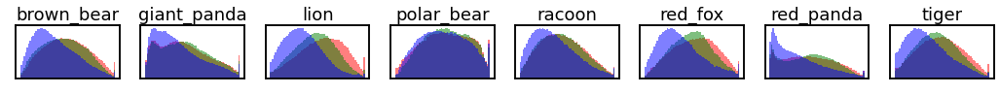

In [14]:
# What does the average RGB color profile look like per class?
plot_class_RGB(X_pixel, y_pixel, metainfo)

**Observation**: The individual RGB color distributions of almost all classes look unique.  
**Decision**: We should use the RGB color profile as a data feature for the image classification.

##Feature Engineering

### RGB Features

From the previous section, we know that the RGB color profile of each image might be useful to identify the image's class. For this reason, let's take the first dataset **X_pixel** and create a second dataset called **X_rgb** that consists only of these RGB color profiles.

In [15]:
# Extract RGB color profiles for each image individually
X_rgb, y_rgb = extract_RGB_features(y_pixel, metainfo)

### Feature from a Convolutional Neural Network

In addition to the RGB color profile as a new data feature, let's also try to extract meaningful features from our images by using a state of the art neural network called [MobileNetV2](https://arxiv.org/abs/1801.04381). **Note**, the neural network that we will use for this feature extraction will be downloaded directly from [Tensorflow Hub](https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/feature_vector/4).

In [16]:
# Extract features according to MobileNetV2 (Convolutional Neural Network)
X_nn, y_nn = extract_neural_network_features()

Building model.
Found 3237 images belonging to 8 classes.
Extracting features.



Dataset was augmented to a total of N=6474 images through means of:
Image rotation, flipping, shifting, zooming and brightness variation.



## 2.3 Recap before Data Modeling


- **X_pixel**: This dataset contains the original data in its raw form. Each value is a RGB pixel value in the original image.
- **X_rgb**: This dataset contains the RGB color profile of each image.
- **X_nn**: This dataset contains an 1280-dimensional feature vectore per image, extracted with a convolutional neural network called MobileNetV2.

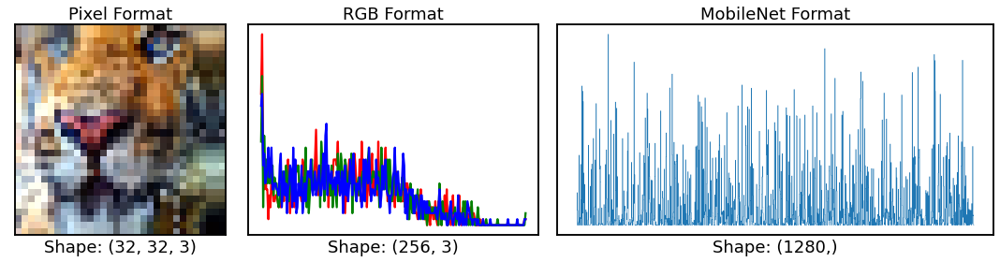

In [17]:
plot_recap(X_pixel, X_rgb, X_nn)

# 3. Modeling and Analysis

1) Data collected, cleaned, and prepared
2) Meaningfull features are extracted - we are ready for the data modeling. 
Fitting and optimization once for each of these three dataset, i.e. **X_pixel**, **X_rgb** and **X_nn**.

Reference (https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.RidgeClassifier.html). **Ridge regression** has the advantage of being rather quick, while also allowing us the fine tuning of a regularization parameter alpha for optimal data fitting. During model optimization, we will be using a crossvalidation approach with 4 folds to fine tune the hyperparameter. To allow to test for generalization, the dataset is initially split into a training and test set according to a 50/50 ratio.A weighted balancing approach during model optimization is applied.

## 3.1. Model Fitting on **X_pixel**

In [18]:
# Train a model fit to the data in pixel format
model_pixel = model_fit(X_pixel, y_pixel)

Fitting 4 folds for each of 25 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   34.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.1min finished


Model trained for 65.13s total and reached an accuracy of: 41.40%


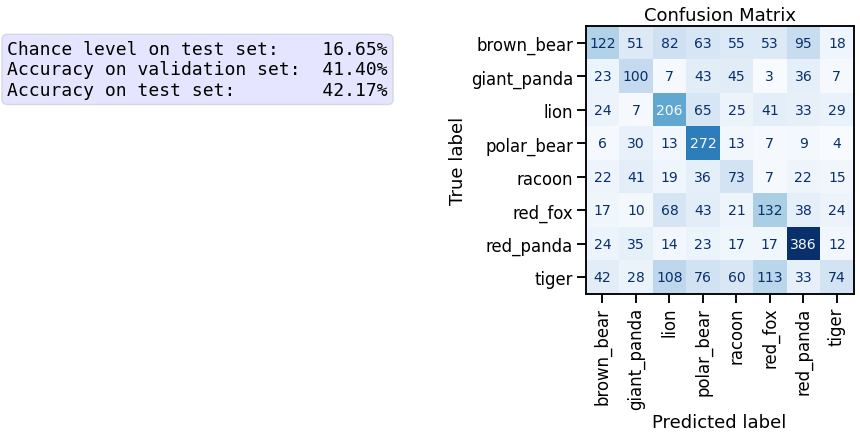

In [19]:
# Investigation of the model performance
check_model_performance(model_pixel, metainfo)

In [0]:
## 3.2. Model Fitting on **X_rgb**

In [21]:
# Train a model fit to the data in rgb format
model_rgb = model_fit(X_rgb, y_rgb)

Fitting 4 folds for each of 25 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    4.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.8s finished


Model trained for 9.89s total and reached an accuracy of: 35.84%


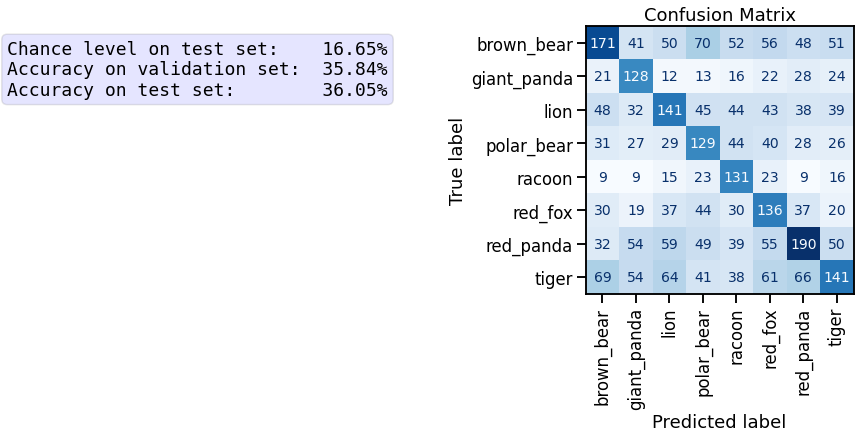

In [22]:
# Investigation of the model performance
check_model_performance(model_rgb, metainfo)

## 3.3. Model Fitting on **X_nn**

In [24]:
# Train a model fit to the data in neural network format
model_nn = model_fit(X_nn, y_nn)

Fitting 4 folds for each of 25 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    6.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   14.1s finished


Model trained for 14.29s total and reached an accuracy of: 99.35%


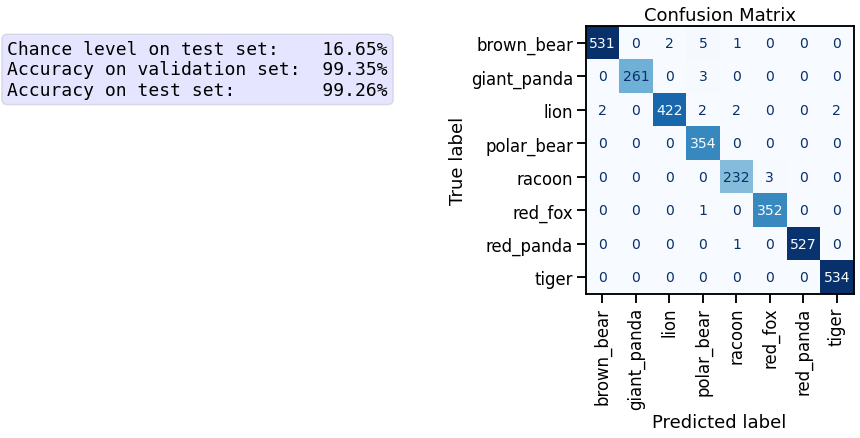

In [25]:
# Investigation of the model performance
check_model_performance(model_nn, metainfo)

##Results Discussion & Exploration

##Investigation of Model Performance

Results: Why did the model predict a given class? With what certainty was this decision made? Which images did the model missclassify and why? Which images are easy or difficult for our model? etc.


The **model_nn** should lead to the best results, so we should investigate its results first. Nonetheless, try to investigate the model performance for the **model_pixel** and **model_rgb** as well by changing the variable name in the following cell and observing the output changes in the following two cells.

In [0]:
# Choose which model to investigate: 'model_pixel', 'model_rgb' or 'model_nn'
model = model_nn

Let's see which images the model did correctly classify and how certain it was:

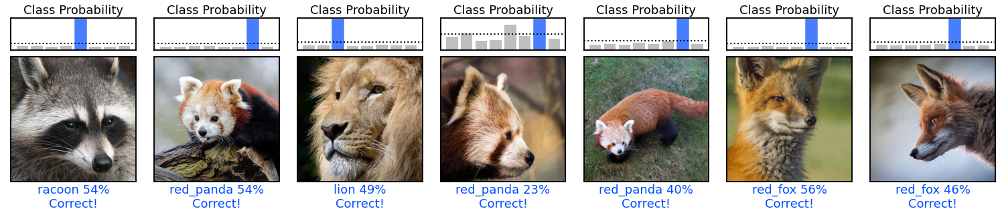

In [27]:
# Plot correct predictions
investigate_predictions(model, metainfo, show_correct=True, nimg=7)

Let's see which images the model did not classify correctly and why it was wrong:

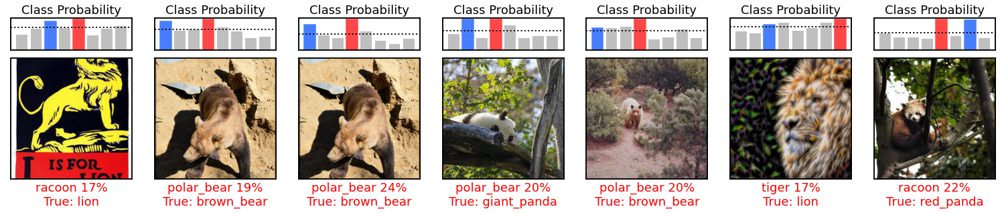

In [28]:
# Plot wrong predictions
investigate_predictions(model, metainfo, show_correct=False, nimg=7)

##Apply Model to new Images from the web

Feature Extraction.
Plotting report.


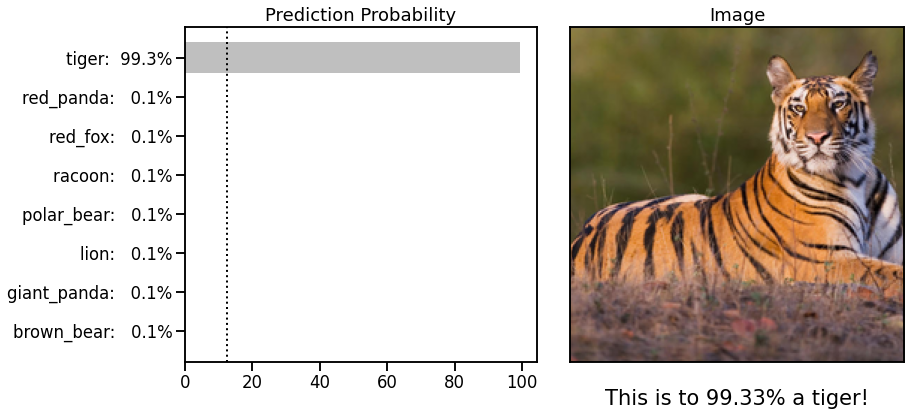

In [29]:
# Predict the class properties of an image from the web
img_url = 'https://c402277.ssl.cf1.rackcdn.com/photos/18134/images/hero_small/Medium_WW226365.jpg?1574452099'
predict_new_image(img_url, model_nn, metainfo)

What about an image that is only slightly related to the target categories?

Feature Extraction.
Plotting report.


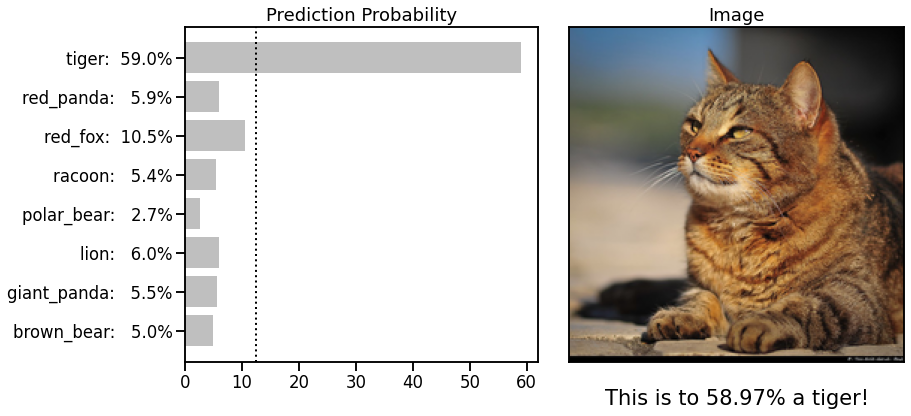

In [30]:
# Predict the class properties of an image from the web
img_url = 'https://live.staticflickr.com/7279/7017467025_8807cc82f6_b.jpg'
predict_new_image(img_url, model_nn, metainfo)

And if you always wondered what kind of animal you are, just plug in your image below:

Feature Extraction.
Plotting report.


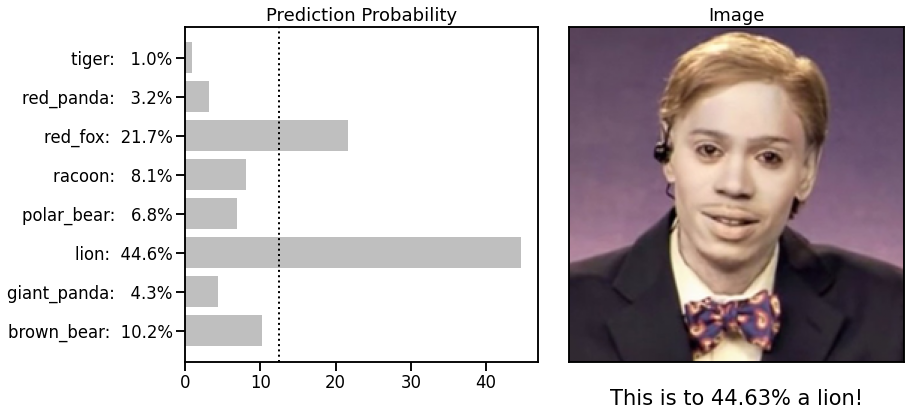

In [32]:
# Predict the class properties of another image from the web
img_url = 'https://images.newrepublic.com/c24c2fa06989758ecddb9fc79483c89213ae8b9a.jpeg?w=1109&h=577&crop=faces&fit=crop&fm=jpg'
predict_new_image(img_url, model_nn, metainfo)